In [1]:
#Imports
import warnings
warnings.filterwarnings("ignore")

import sqlite3
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
%matplotlib inline

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/

from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from chart_studio import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Collection

# 1. Reading Data

In [2]:
# Using the SQLite Table to read data.
con = sqlite3.connect('database.sqlite')

# Filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
filtered_data = pd.read_sql_query("""
Select *
FROM Reviews
WHERE Score != 3
""", con)

# Give reviews with Score>3 a positive rating, and reviews with a score<3 a negative rating.
def partition(x):
    if x < 3:
        return 0
    return 1

# Changing reviews with score less than 3 to be positive and vice-versa
actual_score = filtered_data['Score']
positive_negative = actual_score.map(partition) 
filtered_data['Score'] = positive_negative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head()

Number of data points in our data (525814, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,0,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,1,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [3]:
# Counting no. of 0 and 1 in dataset
filtered_data['Score'].value_counts()

1    443777
0     82037
Name: Score, dtype: int64

In [4]:
# taking equal no. of negative and postive data point
data_pos = filtered_data[filtered_data["Score"] == 1].sample(n = 13000)
data_neg = filtered_data[filtered_data['Score'] == 0].sample(n = 15000)
filtered_data = pd.concat([data_pos,data_neg])
filtered_data.shape

(28000, 10)

In [5]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [6]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


# 2. Data Cleaning

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data. Following is an example:

In [7]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As can be seen above the same user has multiple reviews of the with the same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text  and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [8]:
#Sorting data according to ProductId in ascending order
sorted_data = filtered_data.sort_values("ProductId", axis = 0, ascending = True, inplace = False, 
                                        kind = "quicksort", na_position = "last")

In [9]:
#Deduplication of entries
final = sorted_data.drop_duplicates(subset = {"UserId", "ProfileName", "Time", "Text"}, keep = "first", inplace = False)
final.shape

(25610, 10)

In [10]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

91.46428571428571

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [11]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [12]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [13]:
final.isnull().sum()

Id                        0
ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
Summary                   0
Text                      0
dtype: int64

In [14]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(25610, 10)


0    13004
1    12606
Name: Score, dtype: int64

# 3. Preparing our data for the models and splitting data into train and cv(or test)

In [15]:
#Splitting Data into train and Test sklearn https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(final[["HelpfulnessNumerator", "HelpfulnessDenominator",
                                                          "Summary", "Text", "Score"]],
                                                    final['Score'],
                                                    stratify= final['Score'],
                                                    test_size = 0.25
                                                   )

In [16]:
print(y_train.value_counts())
print(y_test.value_counts())

0    9753
1    9454
Name: Score, dtype: int64
0    3251
1    3152
Name: Score, dtype: int64


In [17]:
#droping the y labels
#https://stackoverflow.com/questions/13411544/delete-column-from-pandas-dataframe-by-column-name
#x_train = 
X_train.drop(["Score"], axis = 1, inplace = True) 
#x_test = 
X_test.drop(["Score"], axis = 1, inplace = True) 

# 4. Text Preprocessing

In [18]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [19]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

##### Preprocessing Train Data of Reviews

In [20]:
# Preprocessing Reviews
from tqdm import tqdm
train_preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(X_train['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    train_preprocessed_reviews.append(sentance.strip())

100%|███████████████████████████████████| 19207/19207 [00:22<00:00, 837.15it/s]


##### Preprocessing Test Data of Reviews

In [21]:
# Preprocessing Summary
from tqdm import tqdm
test_preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(X_test['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    test_preprocessed_reviews.append(sentance.strip())

100%|█████████████████████████████████████| 6403/6403 [00:09<00:00, 650.34it/s]


##### Processing Train Data of Summary

In [22]:
# Preprocessing Reviews
from tqdm import tqdm
train_preprocessed_summary = []
# tqdm is for printing the status bar
for sentance in tqdm(X_train['Summary'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    train_preprocessed_summary.append(sentance.strip())

 55%|██████████████████▋               | 10572/19207 [00:04<00:03, 2648.77it/s]C:\ProgramData\Anaconda3\lib\site-packages\bs4\__init__.py:333: MarkupResemblesLocatorWarning:

"." looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.

 81%|███████████████████████████▋      | 15651/19207 [00:07<00:01, 1824.16it/s]C:\ProgramData\Anaconda3\lib\site-packages\bs4\__init__.py:333: MarkupResemblesLocatorWarning:

"..." looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.

 93%|███████████████████████████████▍  | 17773/19207 [00:08<00:00, 2096.01it/s]C:\ProgramData\Anaconda3\lib\site-packages\bs4\__init__.py:333: MarkupResemblesLocatorWarning:

"..." looks like a filename, not markup. You should probably open this file and pass the filehandle into Beautiful Soup.

100%|██████████████████████████████████| 19207/19207 [00:08<00:00, 2193.71it/s]


##### Processing of Test Data of Summary

In [23]:
# Preprocessing Reviews
from tqdm import tqdm
test_preprocessed_summary = []
# tqdm is for printing the status bar
for sentance in tqdm(X_test['Summary'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    test_preprocessed_summary.append(sentance.strip())

100%|████████████████████████████████████| 6403/6403 [00:03<00:00, 2070.71it/s]


# 5. Encoding

## 5.1 Bow Featurization

In [24]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer1 = CountVectorizer(min_df=10)# its a countvectors used for convert text to vectors
vectorizer1.fit(train_preprocessed_reviews)# that is learned from trainned  data

# we use the fitted CountVectorizer to convert the text to vector
X_train_bow_review = vectorizer1.transform(train_preprocessed_reviews)
X_test_bow_review = vectorizer1.transform(test_preprocessed_reviews)

print("After vectorizations")
print(X_train_bow_review.shape, y_train.shape)
print(X_test_bow_review.shape, y_test.shape)
print("="*100)
# so the dimension of all are the same by using first fit and then transform

After vectorizations
(19207, 5470) (19207,)
(6403, 5470) (6403,)


In [25]:
vectorizer2 = CountVectorizer(min_df=10)
vectorizer2.fit(train_preprocessed_summary)# that is learned from trainned  data

# we use the fitted CountVectorizer to convert the text to vector
X_train_bow_summary = vectorizer2.transform(train_preprocessed_summary)
X_test_bow_summary = vectorizer2.transform(test_preprocessed_summary)

print("After vectorizations")
print(X_train_bow_summary.shape, y_train.shape)
print(X_test_bow_summary.shape, y_test.shape)
print("="*100)
# so the dimension of all are the same by using first fit and then transform

After vectorizations
(19207, 843) (19207,)
(6403, 843) (6403,)


## 5.2 TF-IDF Featurization

In [26]:
# For Review
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer3 = TfidfVectorizer(min_df=10)# its a countvectors used for convert text to vectors
vectorizer3.fit(train_preprocessed_reviews)# that is learned from trainned  data

# we use the fitted CountVectorizer to convert the text to vector
X_train_tf_review = vectorizer3.transform(train_preprocessed_reviews)
X_test_tf_review = vectorizer3.transform(test_preprocessed_reviews)

print("After vectorizations")
print(X_train_tf_review.shape, y_train.shape)
print(X_test_tf_review.shape, y_test.shape)
print("="*100)
# so the dimension of alll are the same by using first fit and then transform

After vectorizations
(19207, 5470) (19207,)
(6403, 5470) (6403,)


In [27]:
# For Summary
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer4 = TfidfVectorizer(min_df=10)# its a countvectors used for convert text to vectors
vectorizer4.fit(train_preprocessed_summary)# that is learned from trainned  data

# we use the fitted CountVectorizer to convert the text to vector
X_train_tf_summary = vectorizer4.transform(train_preprocessed_summary)
X_test_tf_summary = vectorizer4.transform(test_preprocessed_summary)

print("After vectorizations")
print(X_train_tf_summary.shape, y_train.shape)
print(X_test_tf_summary.shape, y_test.shape)
print("="*100)
# so the dimension of alll are the same by using first fit and then transform

After vectorizations
(19207, 843) (19207,)
(6403, 843) (6403,)


## 5.3 Using Pretrained Models: Average W2V

In [28]:
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    
    print ("Loading Glove Model")
    
    f = open(gloveFile,'r', encoding = 'utf8')
    
    model = {}
    
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    
    print ("Done.",len(model)," words loaded!")
    
    return model

In [29]:
model = loadGloveModel('glove.42B.300d.txt')

207it [00:00, 2069.88it/s]

Loading Glove Model


1917494it [14:36, 2188.59it/s]


Done. 1917494  words loaded!


In [30]:
glove_words = set(model.keys())

In [31]:
# average Word2Vec
# compute average word2vec for each review.
def func(wordlist):
  

  train_avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
  for sentence in tqdm(wordlist): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length    # we are taking the 300 dimensions  very large
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    train_avg_w2v_vectors.append(vector)

  print(len(train_avg_w2v_vectors))
  print(len(train_avg_w2v_vectors[0]))
  return train_avg_w2v_vectors

In [32]:
# For Reviews
train_avg_w2v_vectors_review=func(train_preprocessed_reviews)
test_avg_w2v_vectors_review=func(test_preprocessed_reviews)

  0%|                                                 | 0/6403 [00:00<?, ?it/s]

19207
300


100%|█████████████████████████████████████| 6403/6403 [00:12<00:00, 518.22it/s]

6403
300


In [33]:
# For Summary
test_avg_w2v_vectors_summary=func(test_preprocessed_summary)
train_avg_w2v_vectors_summary=func(train_preprocessed_summary)

  0%|                                                | 0/19207 [00:00<?, ?it/s]

6403
300


100%|██████████████████████████████████| 19207/19207 [00:05<00:00, 3283.06it/s]


19207
300


## 5.4 TFIDF weighted W2V

In [34]:
tfidf_model = TfidfVectorizer()
tfidf_model.fit(train_preprocessed_reviews)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [35]:
# average Word2Vec
# compute average word2vec for each review.
def tf_idf_done(word_list):
  
  train_title_tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
  for sentence in tqdm(word_list): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split():#.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    train_title_tfidf_w2v_vectors.append(vector)

  print(len(train_title_tfidf_w2v_vectors))
  print(len(train_title_tfidf_w2v_vectors[0]))
  return train_title_tfidf_w2v_vectors

In [36]:
# For reviews
train_tfidf_w2v_vectors_review=tf_idf_done(train_preprocessed_reviews)
test_tfidf_w2v_vectors_review=tf_idf_done(test_preprocessed_reviews)

  2%|▊                                    | 133/6403 [00:00<00:04, 1303.85it/s]

19207
300


100%|████████████████████████████████████| 6403/6403 [00:06<00:00, 1016.94it/s]

6403
300


In [37]:
# For Summary
train_tfidf_w2v_vectors_summary=tf_idf_done(train_preprocessed_summary)
test_tfidf_w2v_vectors_summary=tf_idf_done(test_preprocessed_summary)

 15%|█████▌                               | 959/6403 [00:00<00:00, 9589.44it/s]

19207
300


100%|████████████████████████████████████| 6403/6403 [00:00<00:00, 8114.87it/s]

6403
300


# 6. Vectorizing Numerical features

##### Helpfulness Numerator

In [38]:
# For Train Data
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

Helpfulness_Numerator = StandardScaler()

Helpfulness_Numerator.fit(X_train['HelpfulnessNumerator'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {Helpfulness_Numerator.mean_[0]}, Standard deviation : {np.sqrt(Helpfulness_Numerator.var_[0])}")

# Now standardize the data with above maen and variance.
train_Helpfulness_Numerator_standar = Helpfulness_Numerator.transform(X_train['HelpfulnessNumerator'].values.reshape(-1, 1))
train_Helpfulness_Numerator_standar

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



Mean : 1.932316342999948, Standard deviation : 5.609468132081212


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



array([[-0.34447407],
       [-0.16620405],
       [-0.34447407],
       ...,
       [-0.34447407],
       [ 0.19033599],
       [ 0.54687603]])

In [39]:
# For Test Data
test_Helpfulness_Numerator_standar = Helpfulness_Numerator.transform(X_test['HelpfulnessNumerator'].values.reshape(-1, 1))
test_Helpfulness_Numerator_standar

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



array([[-0.34447407],
       [ 0.01206597],
       [-0.34447407],
       ...,
       [ 0.01206597],
       [-0.34447407],
       [ 4.11227644]])

##### Helpfulness Denominator

In [40]:
# For Train Data
Helpfulness_Denominator = StandardScaler()

Helpfulness_Denominator.fit(X_train['HelpfulnessDenominator'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {Helpfulness_Denominator.mean_[0]}, Standard deviation : {np.sqrt(Helpfulness_Denominator.var_[0])}")

# Now standardize the data with above maen and variance.
train_Helpfulness_Denominator_standar = Helpfulness_Denominator.transform(X_train['HelpfulnessDenominator'].values.reshape(-1, 1))
train_Helpfulness_Denominator_standar

Mean : 2.925131462487635, Standard deviation : 6.89516563690541


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



array([[-0.42422932],
       [-0.13417103],
       [-0.42422932],
       ...,
       [-0.42422932],
       [ 0.01085812],
       [ 0.88103301]])

In [41]:
# For Test Data
test_Helpfulness_Denominator_standar = Helpfulness_Denominator.transform(X_test['HelpfulnessDenominator'].values.reshape(-1, 1))
test_Helpfulness_Denominator_standar

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning:

Data with input dtype int64 was converted to float64 by StandardScaler.



array([[-0.42422932],
       [-0.13417103],
       [-0.42422932],
       ...,
       [ 0.01085812],
       [-0.42422932],
       [ 3.49155768]])

# 7. Merging

##### All Numerical

In [42]:
# Helpfulness Numerator
print("Shape of Train  ->", train_Helpfulness_Numerator_standar.shape)
print("Shape of test  ->",test_Helpfulness_Numerator_standar.shape)

Shape of Train  -> (19207, 1)
Shape of test  -> (6403, 1)


In [43]:
# Helpfulness Denominator
print("Shape of Train  ->", train_Helpfulness_Denominator_standar.shape)
print("Shape of test  ->",test_Helpfulness_Denominator_standar.shape)

Shape of Train  -> (19207, 1)
Shape of test  -> (6403, 1)


##### BOW

In [44]:
#BOW Project_Essays
print("- "*50)
print("Shape of train ", X_train_bow_review.shape)
print("Shape of test  ", X_test_bow_review.shape)
print("- "*50)

#BOW Project_Titles
print("Shape of train  ", X_train_bow_summary.shape)
print("Shape of test  ", X_test_bow_summary.shape)
print("- "*50)

- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Shape of train  (19207, 5470)
Shape of test   (6403, 5470)
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Shape of train   (19207, 843)
Shape of test   (6403, 843)
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


##### TF-IDF

In [45]:
#TFIDF Project_Essays
print("- "*50)
print("Shape of train ",X_train_tf_review.shape)
print("Shape of test  ",X_test_tf_review.shape)
print("- "*50)
#TFIDF Project_Title

print("Shape of train  ",X_train_tf_summary.shape)
print("Shape of test  ",X_test_tf_summary.shape)

- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Shape of train  (19207, 5470)
Shape of test   (6403, 5470)
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Shape of train   (19207, 843)
Shape of test   (6403, 843)


##### Average W2V

In [46]:
# list to np.array
train_avg_w2v_vectors_review = np.array(train_avg_w2v_vectors_review)
test_avg_w2v_vectors_review = np.array(test_avg_w2v_vectors_review)

train_avg_w2v_vectors_summary = np.array(train_avg_w2v_vectors_summary)
test_avg_w2v_vectors_summary = np.array(test_avg_w2v_vectors_summary)


#TFIDF Project_Essays
print("- "*50)
print("Shape of train ",train_avg_w2v_vectors_review.shape)#train_avg_w2v_vectors_title
print("Shape of test  ",test_avg_w2v_vectors_review.shape)
print("- "*50)
#TFIDF Project_Title

print("Shape of train  ",train_avg_w2v_vectors_summary.shape)
print("Shape of test  ",test_avg_w2v_vectors_summary.shape)
print("- "*50)

- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Shape of train  (19207, 300)
Shape of test   (6403, 300)
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Shape of train   (19207, 300)
Shape of test   (6403, 300)
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


##### TF-IDF W2V

In [47]:
# list to np.array
train_tfidf_w2v_vectors_review = np.array(train_tfidf_w2v_vectors_review)
test_tfidf_w2v_vectors_review = np.array(test_tfidf_w2v_vectors_review)

train_tfidf_w2v_vectors_summary = np.array(train_tfidf_w2v_vectors_summary)
test_tfidf_w2v_vectors_summary = np.array(test_tfidf_w2v_vectors_summary)

#TFIDF Project_Essays
print("- "*50)
print("Shape of train ",train_tfidf_w2v_vectors_review.shape)#train_avg_w2v_vectors_title
print("Shape of test  ",test_tfidf_w2v_vectors_review.shape)
print("- "*50)

#TFIDF Project_Title
print("Shape of train  ",train_tfidf_w2v_vectors_summary.shape)
print("Shape of test  ",test_tfidf_w2v_vectors_summary.shape)
print("- "*50)

- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Shape of train  (19207, 300)
Shape of test   (6403, 300)
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Shape of train   (19207, 300)
Shape of test   (6403, 300)
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


#### Stacking Data: BOW

In [48]:
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx
X_set1_train = hstack((X_train_bow_review, X_train_bow_summary, train_Helpfulness_Numerator_standar, 
                      train_Helpfulness_Denominator_standar))


print(X_set1_train.shape, y_train.shape)

(19207, 6315) (19207,)


In [49]:
X_set1_test = hstack((X_test_bow_review, X_test_bow_summary, test_Helpfulness_Numerator_standar, 
                      test_Helpfulness_Denominator_standar))


print(X_set1_test.shape, y_test.shape)

(6403, 6315) (6403,)


#### Stacking Data: TF-IDF

In [50]:
from scipy.sparse import hstack
# with the same hstack function we are concatinating a sparse matrix and a dense matirx
X_set2_train = hstack((X_train_tf_review, X_train_tf_summary, train_Helpfulness_Numerator_standar, 
                      train_Helpfulness_Denominator_standar))


print(X_set2_train.shape, y_train.shape)

(19207, 6315) (19207,)


In [51]:
X_set2_test = hstack((X_test_tf_review, X_test_tf_summary, test_Helpfulness_Numerator_standar, 
                      test_Helpfulness_Denominator_standar))


print(X_set2_test.shape, y_test.shape)

(6403, 6315) (6403,)


#### Concatenate: Average W2V

In [52]:
X_set3_train = np.concatenate((train_avg_w2v_vectors_review, train_avg_w2v_vectors_summary, 
                               train_Helpfulness_Denominator_standar, train_Helpfulness_Numerator_standar), axis = 1)


print(X_set3_train.shape, y_train.shape)

(19207, 602) (19207,)


In [53]:
X_set3_test = np.concatenate((test_avg_w2v_vectors_review, test_avg_w2v_vectors_summary, 
                               test_Helpfulness_Denominator_standar, test_Helpfulness_Numerator_standar), axis = 1)

print(X_set3_test.shape, y_test.shape)

(6403, 602) (6403,)


#### Concatenate: TF-IDF W2V

In [54]:
X_set4_train = np.concatenate((train_tfidf_w2v_vectors_review, train_tfidf_w2v_vectors_summary, 
                               train_Helpfulness_Denominator_standar, train_Helpfulness_Numerator_standar), axis = 1)


print(X_set4_train.shape, y_train.shape)

(19207, 602) (19207,)


In [55]:
X_set4_test = np.concatenate((test_tfidf_w2v_vectors_review, test_tfidf_w2v_vectors_summary, 
                               test_Helpfulness_Denominator_standar, test_Helpfulness_Numerator_standar), axis = 1)


print(X_set4_test.shape, y_test.shape)

(6403, 602) (6403,)


# 8. Applying Decision Tree

### 8.1 BOW

##### Model Tuning

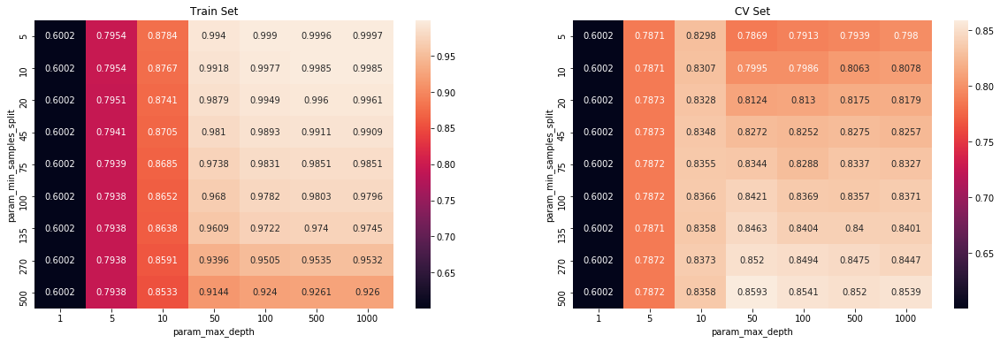

In [56]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

parameters = {'max_depth': [1, 5, 10, 50, 100, 500, 1000], 'min_samples_split': [5, 10, 20, 45, 75, 100, 135, 270, 500]}
model1 = GridSearchCV(dt, parameters, cv=10, scoring='roc_auc',return_train_score=True)
model1.fit(X_set1_train, y_train)

max_scores1 = pd.DataFrame(model1.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]
fig, ax = plt.subplots(1,2, figsize=(20,6))
sns.heatmap(max_scores1.mean_train_score, annot = True, fmt='.4g', ax=ax[0])
sns.heatmap(max_scores1.mean_test_score, annot = True, fmt='.4g', ax=ax[1])
ax[0].set_title('Train Set')
ax[1].set_title('CV Set')
plt.show()

In [57]:
print(model1.best_params_)

{'max_depth': 50, 'min_samples_split': 500}


##### Measuring AUC Score for Test Data

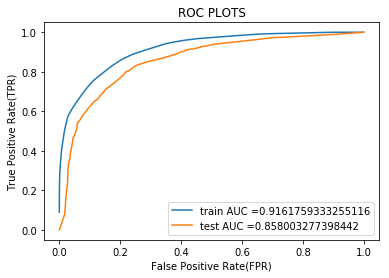

In [58]:
model1 = DecisionTreeClassifier(**model1.best_params_)
model1.fit(X_set1_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

train_fpr, train_tpr, thresholds = roc_curve(y_train, model1.predict_proba(X_set1_train)[:,1])
test_fpr, test_tpr, thresholds = roc_curve(y_test, model1.predict_proba(X_set1_test)[:,1])

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.ylabel("True Positive Rate(TPR)")
plt.xlabel("False Positive Rate(FPR)")
plt.title("ROC PLOTS")
plt.show()

##### Confusion Matrix

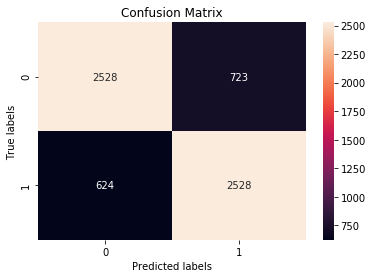

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt     

ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, model1.predict(X_set1_test)), annot=True, ax = ax,fmt='g'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');
ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix');

##### Classification Report

In [60]:
from sklearn.metrics import classification_report

print(classification_report(y_test, model1.predict(X_set1_test)))

             precision    recall  f1-score   support

          0       0.80      0.78      0.79      3251
          1       0.78      0.80      0.79      3152

avg / total       0.79      0.79      0.79      6403



##### Visualising Decision Tree

In [61]:
#Feature aggregation
f1=vectorizer1.get_feature_names()
f2=vectorizer2.get_feature_names()

feature_agg_bow = f1 + f2
feature_agg_bow.append('HelpfulnessNumerator')
feature_agg_bow.append('HelpfulnessDenominator')

#!pip install pydotplus
#!pip install graphviz

In [62]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
import os     
os.environ["PATH"] += os.pathsep + "C:/ProgramData/Anaconda3/Library/bin/graphviz/"
dot_data = StringIO()
export_graphviz(model1, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_bow,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

##### Feature Importance

Text(0,0.5,'Feature Names')

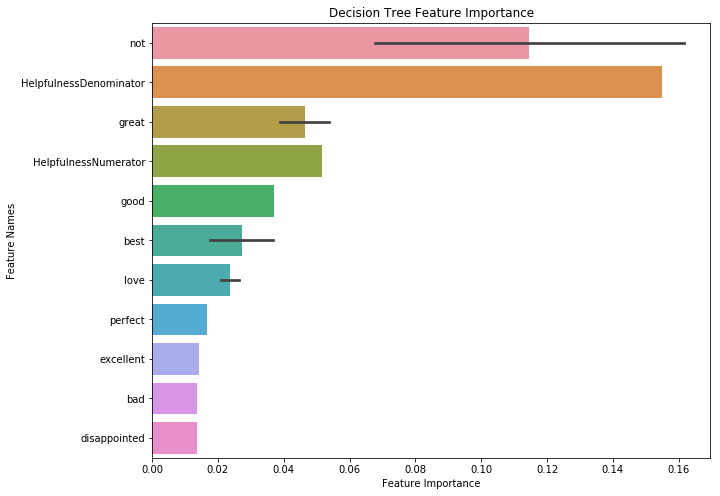

In [63]:
feature_importance = np.array(model1.feature_importances_)
feature_names = feature_agg_bow

#Create a DataFrame using a Dictionary
data={'feature_names':feature_names,'feature_importance':feature_importance}
fi_df = pd.DataFrame(data)

#Sort the DataFrame in order decreasing feature importance
fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

#Define size of bar plot
plt.figure(figsize=(10,8))
#Plot Searborn bar chart
sns.barplot(x='feature_importance', y='feature_names', data=fi_df.head(15))
#Add chart labels
plt.title('Decision Tree Feature Importance')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Names')

##### Analysis on the False Positives

In [64]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fpi = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 0) & (model1.predict(X_set1_test)[i] == 1):
        fpi.append(i)
fp_review1 = []
for i in fpi :
    fp_review1.append(X_test['Text'].values[i])

In [65]:
#Get the False positives datapoints
X_test['Text'].values[fpi[0]]

"I normally buy maruchan ramen and just add curry spices and whatever veggies to the mix, but I figured I'd pay a little more and try these since it looked as though veggies were part of the packaging, like in some of the cup of noodle brands etc, however they were not. The noodles by themselves smell stale as you cook them and once cooked the noodles are mushy, the flavor is pretty weak and the spice is mild at best. Guess I'll stick to original recipe, a little more effort but 1/4 the cost."

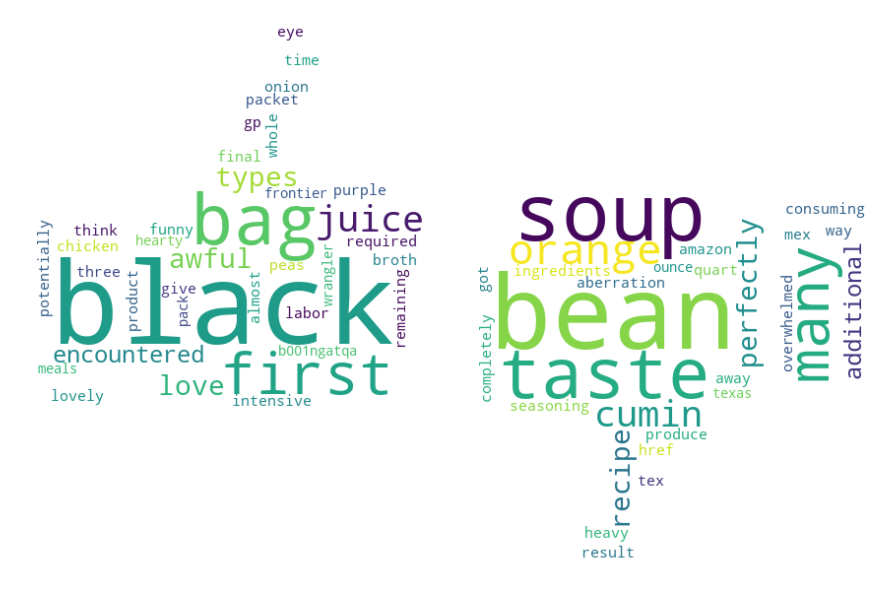

In [66]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
mask = np.array(Image.open("FalsePositive.jpg"))
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_review1 :
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 2000, height = 3000, background_color ='white', mask = mask, stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (12, 12), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()


##### Analysing False Negatives

In [67]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fni = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 1) & (model1.predict(X_set1_test)[i] == 0):
        fni.append(i)
fn_review1 = []
for i in fni :
    fn_review1.append(X_test['Text'].values[i])

In [68]:
#Get the False negative datapoints
X_test['Text'].values[fni[0]]

"My aunt used to bring or send me an advent calendar with Kinder chocolates from Germany for Christmas every year when I was a kid.  Now I share Kinder chocolates with my kids while we mark the days on our advent calendar.  It's a tradition I'm passing on and it would not be the same without these incredible chocolates!!  My kids fell in love at first bite just like I did years ago.  Kinder is awesome.  Order early though, since they took a while to arrive (at least around the Christmas holiday).  But they were perfectly packaged and preserved when I received them."

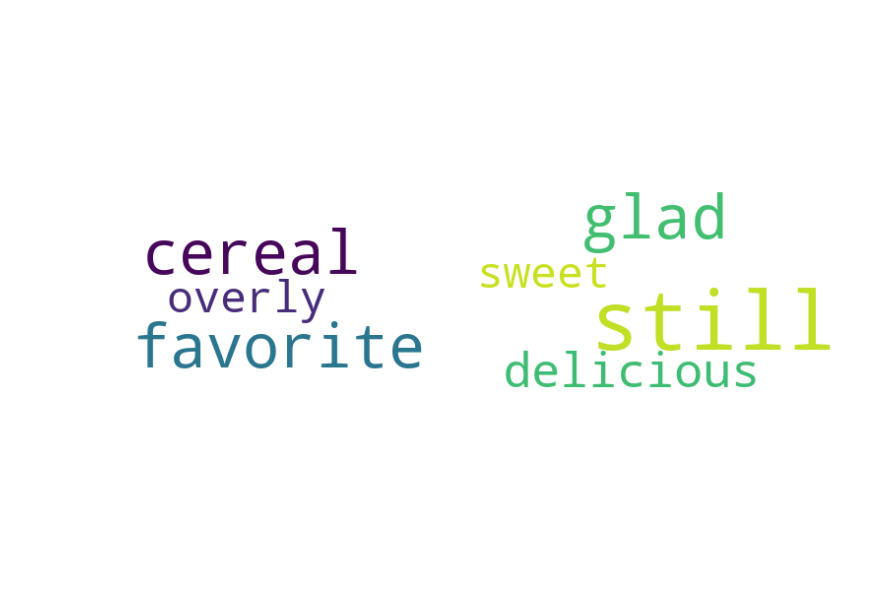

In [69]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
mask = np.array(Image.open("FalseNegative.jpg"))
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fn_review1 :
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 1500, height = 1500, background_color ='white', mask = mask, stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (12, 12), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

### 8.2 TF-IDF

##### Model Tuning

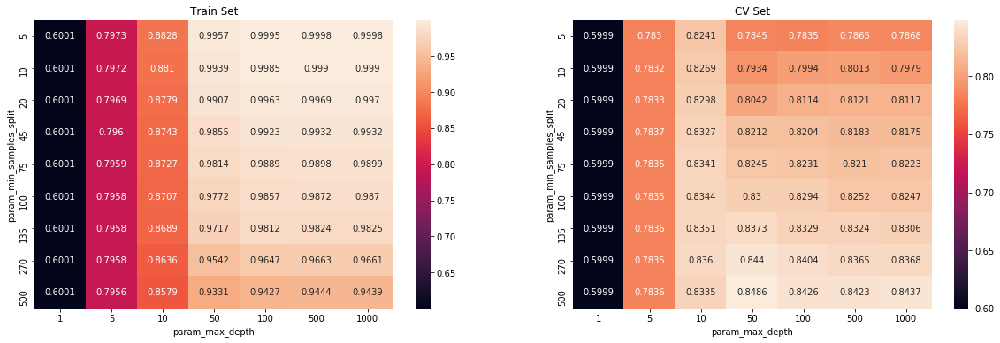

In [70]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

parameters = {'max_depth': [1, 5, 10, 50, 100, 500, 1000], 'min_samples_split': [5, 10, 20, 45, 75, 100, 135, 270, 500]}
model2 = GridSearchCV(dt, parameters, cv=10, scoring='roc_auc',return_train_score=True)
model2.fit(X_set2_train, y_train)

max_scores2 = pd.DataFrame(model2.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]
fig, ax = plt.subplots(1,2, figsize=(20,6))
sns.heatmap(max_scores2.mean_train_score, annot = True, fmt='.4g', ax=ax[0])
sns.heatmap(max_scores2.mean_test_score, annot = True, fmt='.4g', ax=ax[1])
ax[0].set_title('Train Set')
ax[1].set_title('CV Set')
plt.show()

In [71]:
print(model2.best_params_)

{'max_depth': 50, 'min_samples_split': 500}


##### Measuring AUC Score for Test Data

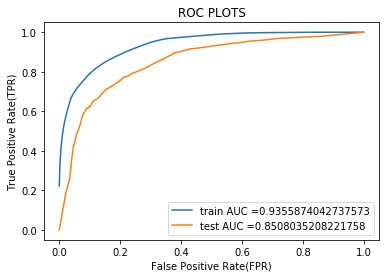

In [72]:
model2 = DecisionTreeClassifier(**model2.best_params_)
model2.fit(X_set2_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

train_fpr, train_tpr, thresholds = roc_curve(y_train, model2.predict_proba(X_set2_train)[:,1])
test_fpr, test_tpr, thresholds = roc_curve(y_test, model2.predict_proba(X_set2_test)[:,1])

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.ylabel("True Positive Rate(TPR)")
plt.xlabel("False Positive Rate(FPR)")
plt.title("ROC PLOTS")
plt.show()

##### Confusion Matrix

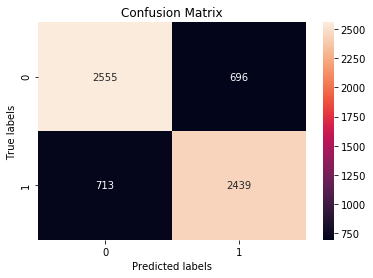

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt     

ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, model2.predict(X_set2_test)), annot=True, ax = ax,fmt='g'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');
ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix');

##### Classification Report

In [74]:
from sklearn.metrics import classification_report

print(classification_report(y_test, model2.predict(X_set2_test)))

             precision    recall  f1-score   support

          0       0.78      0.79      0.78      3251
          1       0.78      0.77      0.78      3152

avg / total       0.78      0.78      0.78      6403



##### Visualising Decision Tree

In [75]:
#Feature aggregation
f3=vectorizer3.get_feature_names()
f4=vectorizer4.get_feature_names()

feature_agg_tfidf = f3 + f4
feature_agg_tfidf.append('HelpfulnessNumerator')
feature_agg_tfidf.append('HelpfulnessDenominator')

In [76]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.externals.six import StringIO
from IPython.display import Image
from sklearn.tree import export_graphviz
import pydotplus
import os     
os.environ["PATH"] += os.pathsep + "C:/ProgramData/Anaconda3/Library/bin/graphviz/"
dot_data = StringIO()
export_graphviz(model2, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_tfidf,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

##### Feature Importance

Text(0,0.5,'Feature Names')

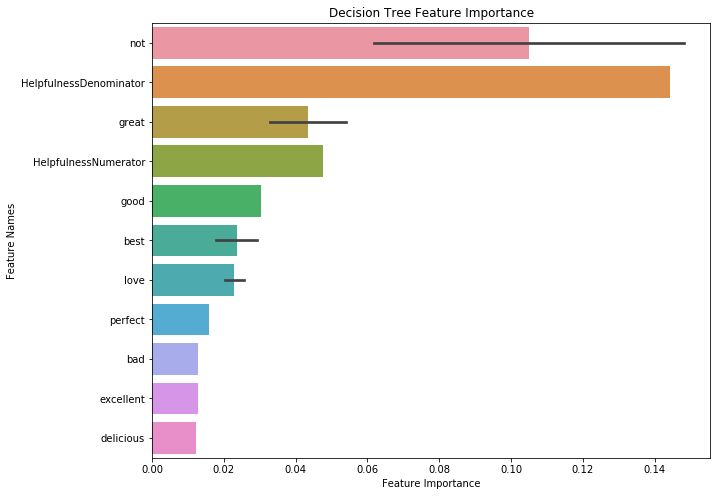

In [77]:
feature_importance = np.array(model2.feature_importances_)
feature_names = feature_agg_tfidf

#Create a DataFrame using a Dictionary
data={'feature_names':feature_names,'feature_importance':feature_importance}
fi_df = pd.DataFrame(data)

#Sort the DataFrame in order decreasing feature importance
fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

#Define size of bar plot
plt.figure(figsize=(10,8))
#Plot Searborn bar chart
sns.barplot(x='feature_importance', y='feature_names', data=fi_df.head(15))
#Add chart labels
plt.title('Decision Tree Feature Importance')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Names')

##### Analysis on the False Positives

In [78]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fpi = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 0) & (model2.predict(X_set2_test)[i] == 1):
        fpi.append(i)
fp_review2 = []
for i in fpi :
    fp_review2.append(X_test['Text'].values[i])

In [79]:
#Get the False positives datapoints
X_test['Text'].values[fpi[0]]

"I was not thrilled with this product. It's got a weird texture, very spongy, and a strange taste, bland yet odd. I'd imagined thick slabs browned in a pan with maple syrup, but it was too gross for me to want to eat a big piece. I diced it instead and added it to fried rice ... still gross. The rest went in the garbage. There are A LOT of better fake meat products out there - or you can just make your own. A homemade seitan log is much tastier!"

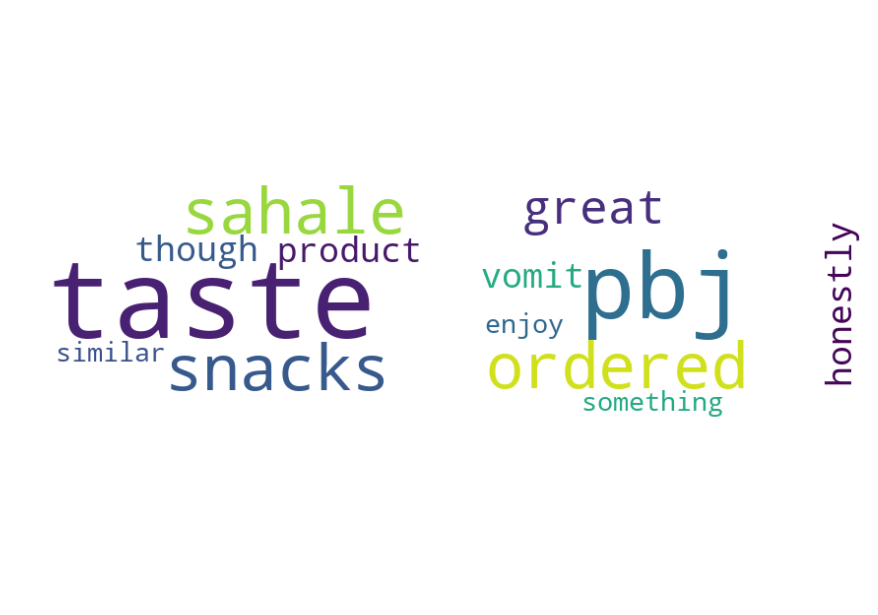

In [80]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
mask = np.array(Image.open("FalsePositive.jpg"))
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_review2 :
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 2000, height = 3000, background_color ='white', mask = mask, stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (12, 12), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

##### Analysing False Negatives

In [81]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fni = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 1) & (model2.predict(X_set2_test)[i] == 0):
        fni.append(i)
fn_review2 = []
for i in fni :
    fn_review2.append(X_test['Text'].values[i])

In [82]:
#Get the False negative datapoints
X_test['Text'].values[fni[0]]

"I threw a big party with catered gourmet food, wine, etc,etc. These candies were around the table, and are all anyone asked about. The party's honoree took them all home with her. They outshined my party. :)"

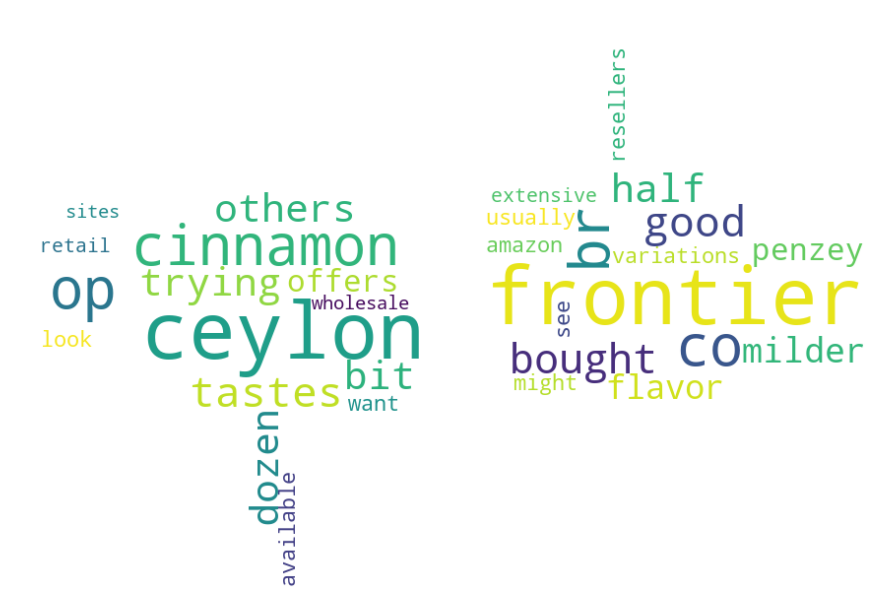

In [83]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
mask = np.array(Image.open("FalseNegative.jpg"))
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fn_review2 :
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 1500, height = 1500, background_color ='white', mask = mask, stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (12, 12), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

### 8.3 Average W2V

##### Model Tuning

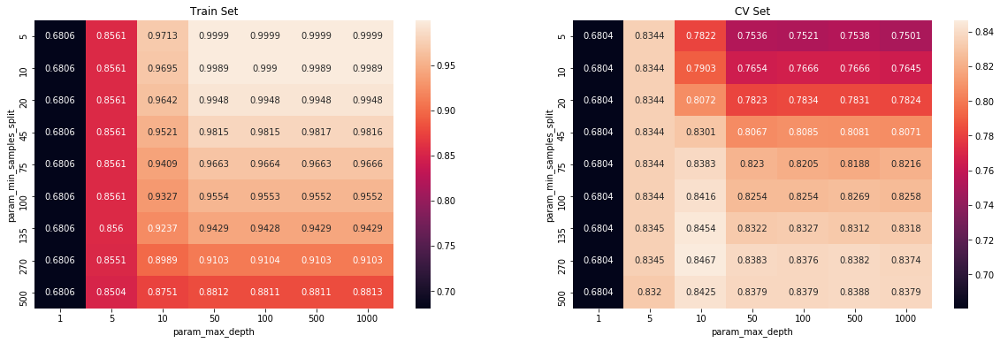

In [84]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

parameters = {'max_depth': [1, 5, 10, 50, 100, 500, 1000], 'min_samples_split': [5, 10, 20, 45, 75, 100, 135, 270, 500]}
model3 = GridSearchCV(dt, parameters, cv=10, scoring='roc_auc',return_train_score=True)
model3.fit(X_set3_train, y_train)

max_scores3 = pd.DataFrame(model3.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]
fig, ax = plt.subplots(1,2, figsize=(20,6))
sns.heatmap(max_scores3.mean_train_score, annot = True, fmt='.4g', ax=ax[0])
sns.heatmap(max_scores3.mean_test_score, annot = True, fmt='.4g', ax=ax[1])
ax[0].set_title('Train Set')
ax[1].set_title('CV Set')
plt.show()

In [85]:
print(model3.best_params_)

{'max_depth': 10, 'min_samples_split': 270}


##### Measuring AUC Score for Test Data

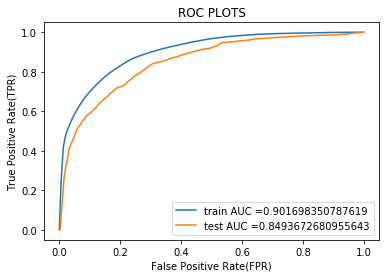

In [86]:
model3 = DecisionTreeClassifier(**model3.best_params_)
model3.fit(X_set3_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

train_fpr, train_tpr, thresholds = roc_curve(y_train, model3.predict_proba(X_set3_train)[:,1])
test_fpr, test_tpr, thresholds = roc_curve(y_test, model3.predict_proba(X_set3_test)[:,1])

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.ylabel("True Positive Rate(TPR)")
plt.xlabel("False Positive Rate(FPR)")
plt.title("ROC PLOTS")
plt.show()

##### Confusion Matrix

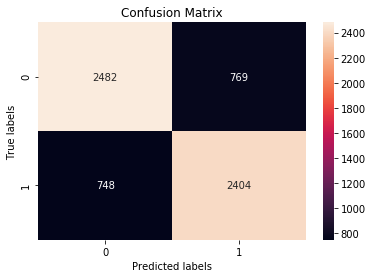

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt     

ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, model3.predict(X_set3_test)), annot=True, ax = ax,fmt='g'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');
ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix');

##### Classification Report

In [88]:
from sklearn.metrics import classification_report

print(classification_report(y_test, model3.predict(X_set3_test)))

             precision    recall  f1-score   support

          0       0.77      0.76      0.77      3251
          1       0.76      0.76      0.76      3152

avg / total       0.76      0.76      0.76      6403



##### Analysing False Positives

In [89]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fpi = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 0) & (model3.predict(X_set3_test)[i] == 1):
        fpi.append(i)
fp_review3 = []
for i in fpi :
    fp_review3.append(X_test['Text'].values[i])

In [90]:
#Get the False positives datapoints
X_test['Text'].values[fpi[0]]

'Upon recieving order, Boston Baked Beans were immediately thrown in the trash. It may be a personal preferrence but, they were hard as a rock and not soft at all where the coating is concerned.They were removed from my list. I ordered a good supply but, was really disapointed. Not so much in the seller but, in the product.'

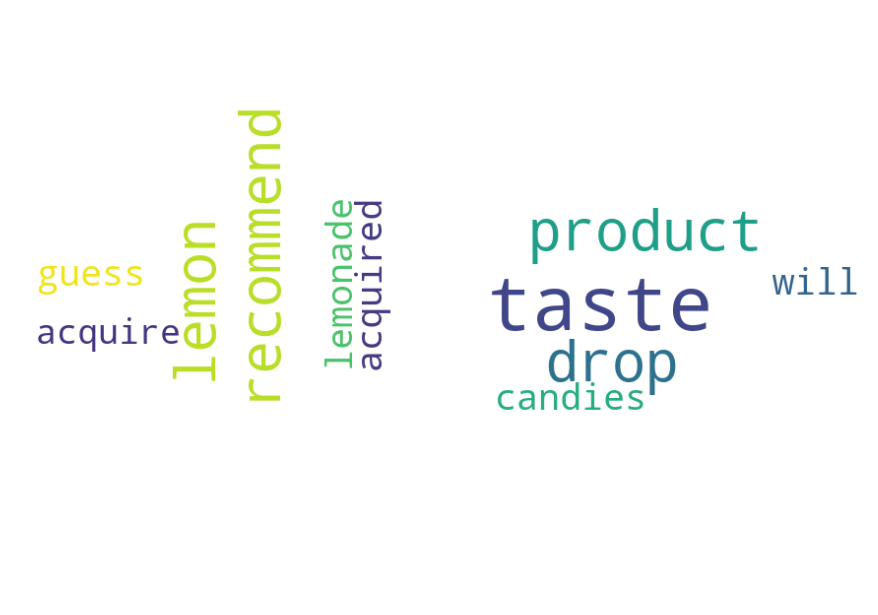

In [91]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
mask = np.array(Image.open("FalsePositive.jpg"))
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_review3 :
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 2000, height = 3000, background_color ='white', mask = mask, stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (12, 12), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

##### Analysing False Negatives

In [92]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fni = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 1) & (model3.predict(X_set3_test)[i] == 0):
        fni.append(i)
fn_review3 = []
for i in fni :
    fn_review3.append(X_test['Text'].values[i])

In [93]:
#Get the False Negative datapoints
X_test['Text'].values[fni[0]]

"My son says this is the best cocoa he's ever had, and I have to admit it's dashed yummy.  But, there are also very good cocoas in foil packets in the supermarket which taste this good.  On the whole an electric kettle and some packets of Land O'Lakes cocoa are just as good as the Dolce Gusto system for cocoa drinks.<br /><br />This is better than the Keurig cocoas.<br /><br />One big caveat:  we thought this could be made on the cold setting for luxurious chocolate milk, but it came out watery and disgusting.  After that, I went back and read the leaflet, and it's not meant to be made cold.  Cocoa only!"

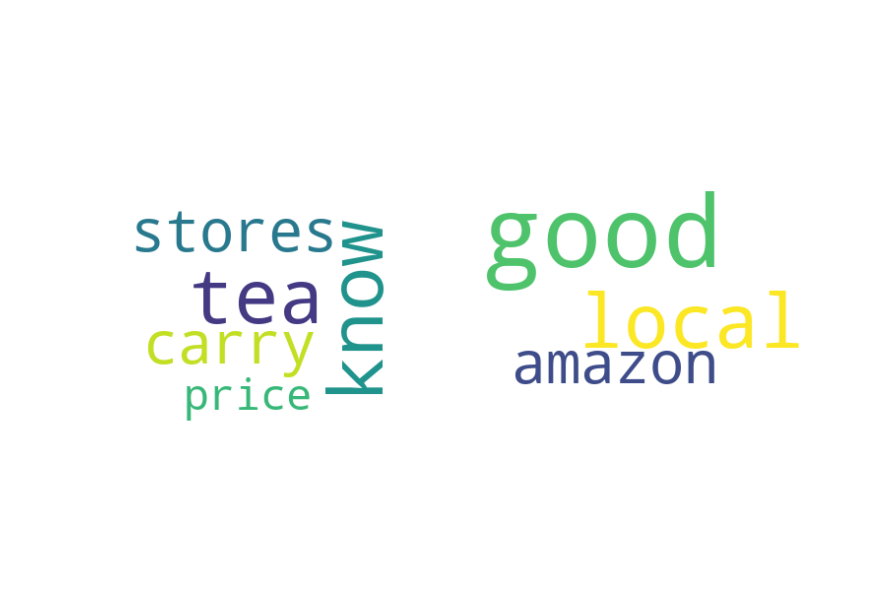

In [94]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
mask = np.array(Image.open("FalseNegative.jpg"))
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fn_review3 :
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 1500, height = 1500, background_color ='white', mask = mask, stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (12, 12), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

### 8.4 TF-IDF W2V

##### Model Tuning

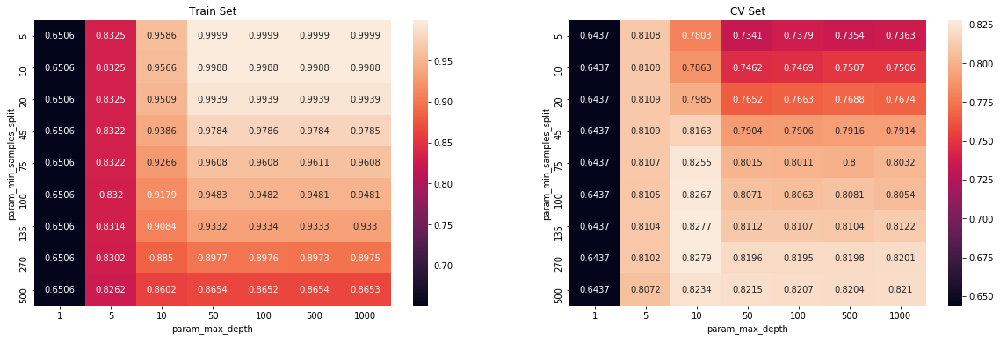

In [95]:
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

parameters = {'max_depth': [1, 5, 10, 50, 100, 500, 1000], 'min_samples_split': [5, 10, 20, 45, 75, 100, 135, 270, 500]}
model4 = GridSearchCV(dt, parameters, cv=10, scoring='roc_auc',return_train_score=True)
model4.fit(X_set4_train, y_train)

max_scores4 = pd.DataFrame(model4.cv_results_).groupby(['param_min_samples_split', 'param_max_depth']).max().unstack()[['mean_test_score', 'mean_train_score']]
fig, ax = plt.subplots(1,2, figsize=(20,6))
sns.heatmap(max_scores4.mean_train_score, annot = True, fmt='.4g', ax=ax[0])
sns.heatmap(max_scores4.mean_test_score, annot = True, fmt='.4g', ax=ax[1])
ax[0].set_title('Train Set')
ax[1].set_title('CV Set')
plt.show()

In [96]:
print(model4.best_params_)

{'max_depth': 10, 'min_samples_split': 270}


##### Measuring AUC Score for Test Data

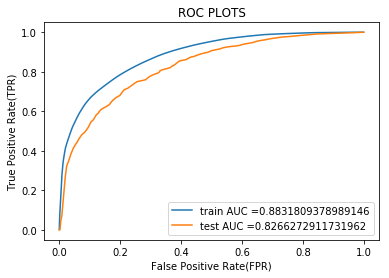

In [97]:
model4 = DecisionTreeClassifier(**model4.best_params_)
model4.fit(X_set4_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

train_fpr, train_tpr, thresholds = roc_curve(y_train, model4.predict_proba(X_set4_train)[:,1])
test_fpr, test_tpr, thresholds = roc_curve(y_test, model4.predict_proba(X_set4_test)[:,1])

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.ylabel("True Positive Rate(TPR)")
plt.xlabel("False Positive Rate(FPR)")
plt.title("ROC PLOTS")
plt.show()

##### Confusion Matrix

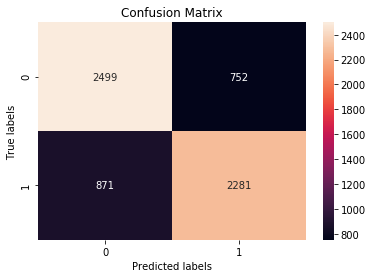

In [98]:
import seaborn as sns
import matplotlib.pyplot as plt     

ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test, model4.predict(X_set4_test)), annot=True, ax = ax,fmt='g'); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');
ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix');

##### Classification Report

In [99]:
from sklearn.metrics import classification_report

print(classification_report(y_test, model4.predict(X_set4_test)))

             precision    recall  f1-score   support

          0       0.74      0.77      0.75      3251
          1       0.75      0.72      0.74      3152

avg / total       0.75      0.75      0.75      6403



##### Analysing False Positives

In [100]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fpi = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 0) & (model4.predict(X_set4_test)[i] == 1):
        fpi.append(i)
fp_review4 = []
for i in fpi :
    fp_review4.append(X_test['Text'].values[i])

In [101]:
#Get the False positives datapoints
X_test['Text'].values[fpi[0]]

'Upon recieving order, Boston Baked Beans were immediately thrown in the trash. It may be a personal preferrence but, they were hard as a rock and not soft at all where the coating is concerned.They were removed from my list. I ordered a good supply but, was really disapointed. Not so much in the seller but, in the product.'

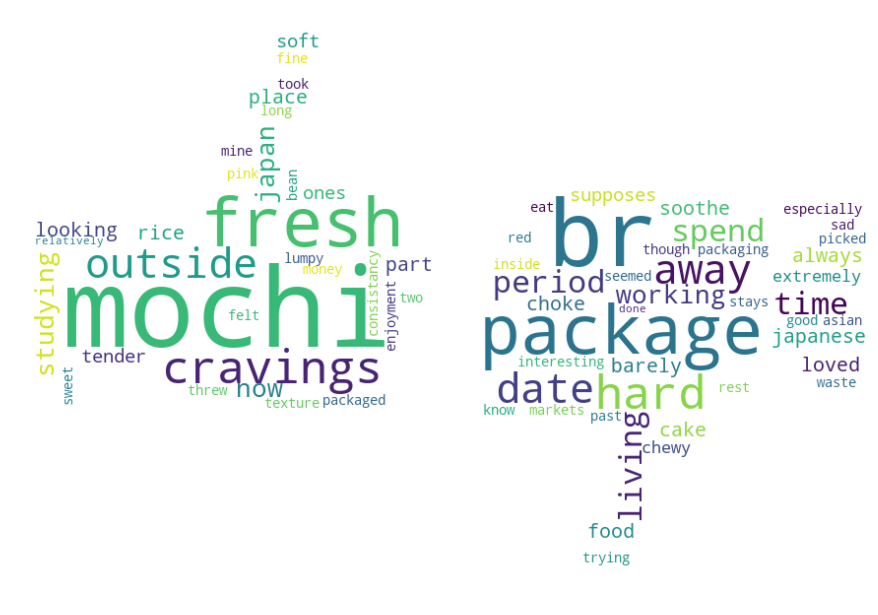

In [102]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
mask = np.array(Image.open("FalsePositive.jpg"))
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_review4 :
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 2000, height = 3000, background_color ='white', mask = mask, stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (12, 12), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

##### Analysing False Negatives

In [103]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fni = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 1) & (model4.predict(X_set4_test)[i] == 0):
        fni.append(i)
fn_review4 = []
for i in fni :
    fn_review4.append(X_test['Text'].values[i])

In [104]:
#Get the False Negative datapoints
X_test['Text'].values[fni[0]]

"My aunt used to bring or send me an advent calendar with Kinder chocolates from Germany for Christmas every year when I was a kid.  Now I share Kinder chocolates with my kids while we mark the days on our advent calendar.  It's a tradition I'm passing on and it would not be the same without these incredible chocolates!!  My kids fell in love at first bite just like I did years ago.  Kinder is awesome.  Order early though, since they took a while to arrive (at least around the Christmas holiday).  But they were perfectly packaged and preserved when I received them."

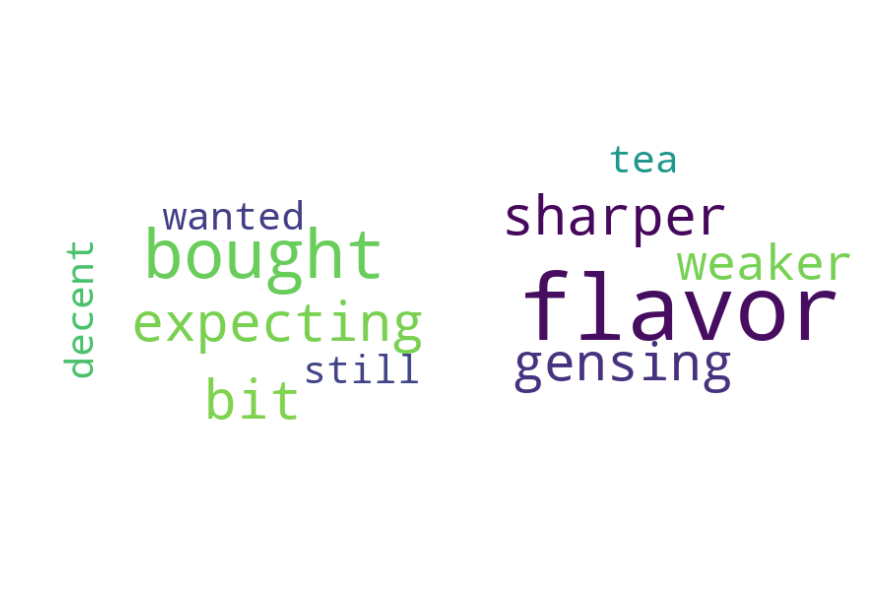

In [106]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
mask = np.array(Image.open("FalseNegative.jpg"))
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fn_review4 :
    val = str(val)
    tokens = val.split()
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 2000, height = 3000, background_color ='white', mask = mask, stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (12, 12), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

In [109]:
from prettytable import PrettyTable
tb = PrettyTable()
tb.field_names= (" Model ", " Vectorizer ", " Test -AUC ", "F1-Score")
tb.add_row([ "Decision Tree", " BOW ", 0.858, 0.79 ])
tb.add_row([ "Decision Tree", " Tf - Idf", 0.851, 0.78])
tb.add_row([ "Decision Tree", " AVG-W2V", 0.849, 0.76])
tb.add_row([ "Decision Tree", " AVG - Tf - Idf", 0.826, 0.75])
print(tb)

+---------------+-----------------+-------------+----------+
|     Model     |    Vectorizer   |  Test -AUC  | F1-Score |
+---------------+-----------------+-------------+----------+
| Decision Tree |       BOW       |    0.858    |   0.79   |
| Decision Tree |     Tf - Idf    |    0.851    |   0.78   |
| Decision Tree |      AVG-W2V    |    0.849    |   0.76   |
| Decision Tree |  AVG - Tf - Idf |    0.826    |   0.75   |
+---------------+-----------------+-------------+----------+
